<a href="https://www.kaggle.com/code/romikgosai/imgcolorizefeb7?scriptVersionId=162065211" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")


Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented/"
x = load(os.path.join(path, 'train/Train_3221.jpg'))
print(x.shape)

(300, 300, 3)


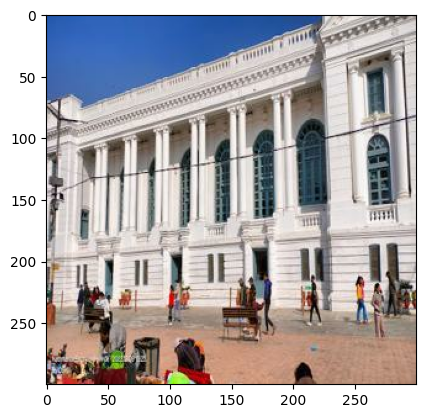

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

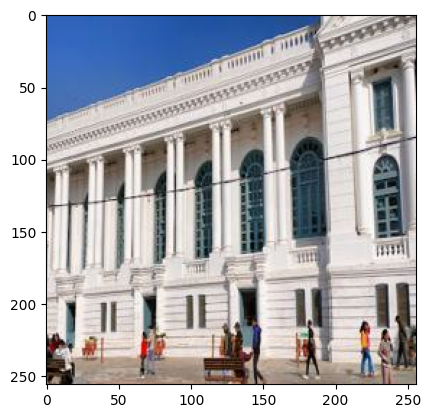

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

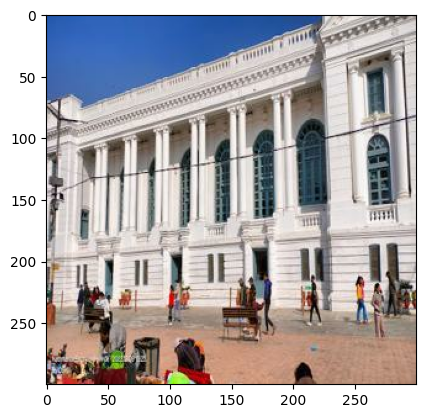

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [16]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [17]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [18]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [19]:
test_dataset = tf.data.Dataset.list_files(path + 'val/*.jpg')
test_dataset = test_dataset.map(load_test_image)
test_dataset = test_dataset.batch(BATCH_SIZE)
test_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [20]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 150, 3)


In [21]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 300, 3)


In [22]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(64, 4, batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4, dropout = True),
        downsample(512, 4, dropout = True),
        downsample(512, 4, dropout = True),
        downsample(512, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4),
        upsample(64, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

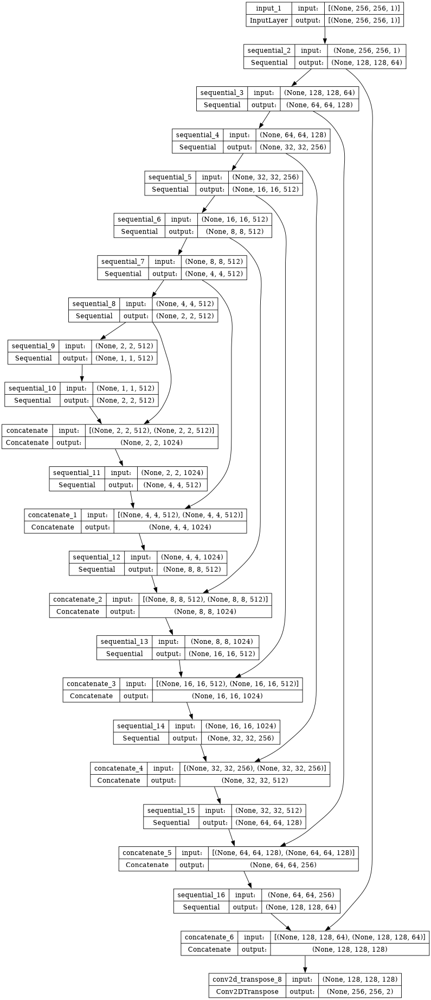

In [23]:
gen = generator()
plot_model(gen, show_shapes=True, dpi = 64)

In [24]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

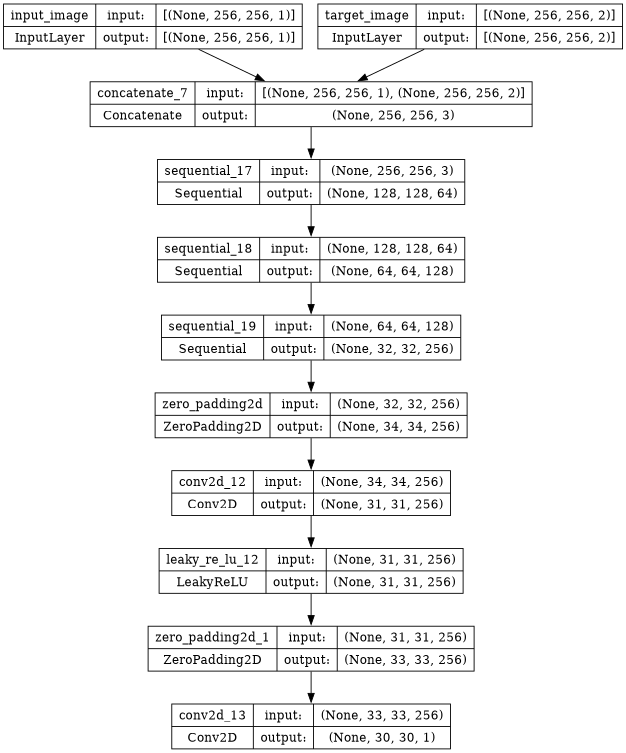

In [25]:
disc = discriminator()
plot_model(disc, show_shapes=True, dpi = 64)

In [26]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [27]:
LAMBDA = 30

In [28]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [29]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 40*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [30]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [31]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [32]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [33]:
epochs = 250

In [34]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

        ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        if epoch > 10:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values

In [35]:
@tf.function
def test_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

    ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values


In [36]:
os.mkdir('/kaggle/working/gen_output/')

In [37]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
    p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
    print('Perceptual Loss: {}'.format(p_loss))

In [38]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...
80134624/80134624 [==============================] - 4s 0us/step


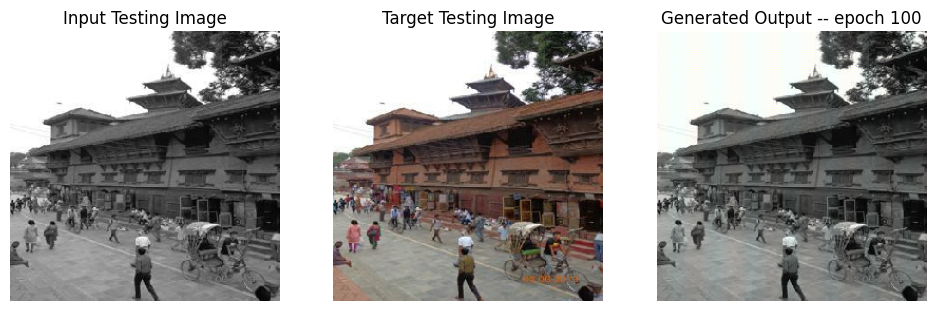

SSIM Score: 0.8963308334350586
PSNR Score: 26.92061424255371
Perceptual Loss: 0.015096904709935188


In [39]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_1000.jpg',100)

In [40]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
testing_ssim = []
testing_psnr = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    for epoch in range(epochs):
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr = test_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
        print("Testing Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        if time.time() - time_start > 26000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/Val_65.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if epoch > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [41]:
tf.config.run_functions_eagerly(True)

Epoch 0
Training Details
Generator-- total_loss:2.61782 gan_loss:0.90976 l1_loss:0.04517 perceptual_loss:0.00883 Discriminator-- total_loss:1.58815 real_loss:0.79897 generated_loss:0.78918 --- SSIM 0.85726 PSNR 22.80359
Time taken for epoch 1 is 654.3393862247467 sec
Number of iteration 490
Testing Details
Generator-- total_loss:2.40560 gan_loss:0.62025 l1_loss:0.04551  perceptual_loss:0.01050 Discriminator-- total_loss:1.49844 real_loss:0.79767 generated_loss:0.70077 --- SSIM 0.89616 PSNR 23.00978
Time taken for epoch 1 is 747.4600756168365 sec
Number of iteration 140
Displaying one random test image...


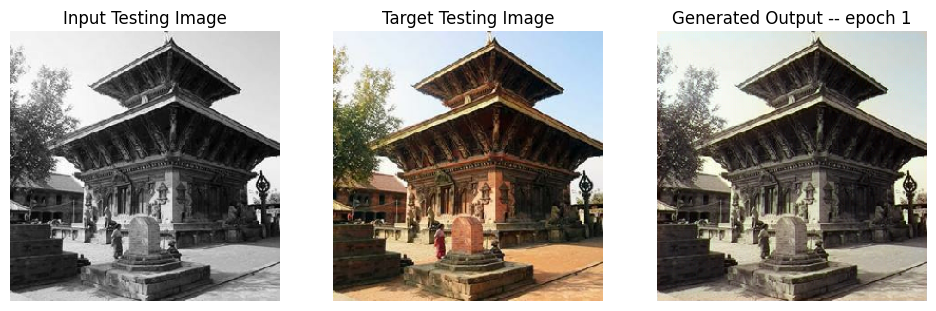

SSIM Score: 0.9497484564781189
PSNR Score: 24.174362182617188
Perceptual Loss: 0.006772901397198439
Epoch 1
Training Details
Generator-- total_loss:2.27612 gan_loss:0.76019 l1_loss:0.04072 perceptual_loss:0.00736 Discriminator-- total_loss:1.36548 real_loss:0.68303 generated_loss:0.68245 --- SSIM 0.91335 PSNR 23.41342
Time taken for epoch 2 is 654.3004043102264 sec
Number of iteration 490
Testing Details
Generator-- total_loss:3.39854 gan_loss:0.77044 l1_loss:0.07475  perceptual_loss:0.00964 Discriminator-- total_loss:1.37930 real_loss:0.65420 generated_loss:0.72510 --- SSIM 0.89358 PSNR 19.02775
Time taken for epoch 2 is 747.0696520805359 sec
Number of iteration 140
Epoch 2
Training Details
Generator-- total_loss:2.26353 gan_loss:0.77104 l1_loss:0.04002 perceptual_loss:0.00730 Discriminator-- total_loss:1.36665 real_loss:0.68151 generated_loss:0.68514 --- SSIM 0.92401 PSNR 23.45674
Time taken for epoch 3 is 643.2703444957733 sec
Number of iteration 490
Testing Details
Generator-- tota

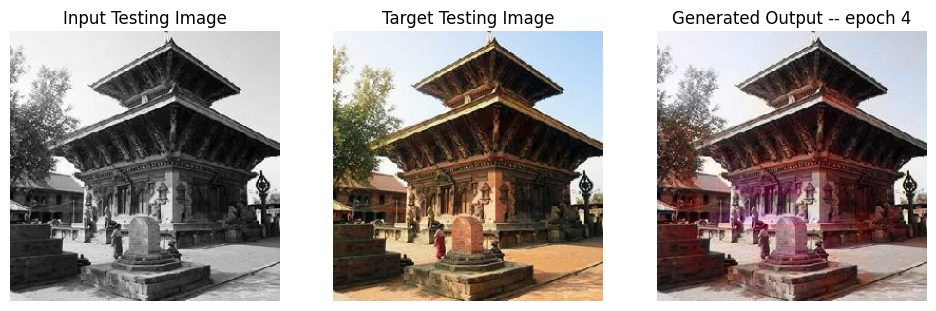

SSIM Score: 0.9477956295013428
PSNR Score: 23.804826736450195
Perceptual Loss: 0.0067281583324074745
Epoch 4
Training Details
Generator-- total_loss:2.24815 gan_loss:0.76005 l1_loss:0.03980 perceptual_loss:0.00735 Discriminator-- total_loss:1.36778 real_loss:0.68079 generated_loss:0.68699 --- SSIM 0.92552 PSNR 23.53382
Time taken for epoch 5 is 641.411346912384 sec
Number of iteration 490
Testing Details
Generator-- total_loss:2.73365 gan_loss:0.91661 l1_loss:0.04865  perceptual_loss:0.00893 Discriminator-- total_loss:1.28250 real_loss:0.63347 generated_loss:0.64904 --- SSIM 0.91131 PSNR 21.88840
Time taken for epoch 5 is 733.5886147022247 sec
Number of iteration 140
Epoch 5
Training Details
Generator-- total_loss:2.21335 gan_loss:0.74771 l1_loss:0.03926 perceptual_loss:0.00720 Discriminator-- total_loss:1.36815 real_loss:0.67967 generated_loss:0.68848 --- SSIM 0.92902 PSNR 23.61179
Time taken for epoch 6 is 646.4691202640533 sec
Number of iteration 490
Testing Details
Generator-- tota

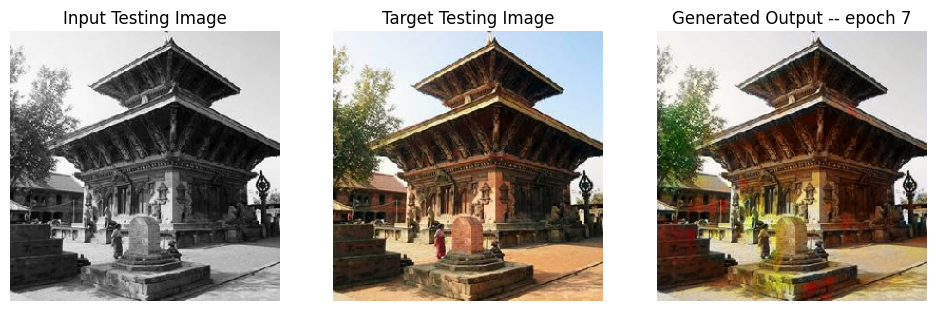

SSIM Score: 0.942183256149292
PSNR Score: 25.25322914123535
Perceptual Loss: 0.006357292179018259
Epoch 7
Training Details
Generator-- total_loss:2.20602 gan_loss:0.75850 l1_loss:0.03869 perceptual_loss:0.00717 Discriminator-- total_loss:1.36483 real_loss:0.67860 generated_loss:0.68623 --- SSIM 0.93189 PSNR 23.70488
Time taken for epoch 8 is 638.8502094745636 sec
Number of iteration 490
Testing Details
Generator-- total_loss:3.14819 gan_loss:0.93107 l1_loss:0.05949  perceptual_loss:0.01081 Discriminator-- total_loss:1.32655 real_loss:0.53352 generated_loss:0.79303 --- SSIM 0.87655 PSNR 19.90502
Time taken for epoch 8 is 732.672623872757 sec
Number of iteration 140
Epoch 8
Training Details
Generator-- total_loss:2.18709 gan_loss:0.75982 l1_loss:0.03812 perceptual_loss:0.00709 Discriminator-- total_loss:1.37229 real_loss:0.68208 generated_loss:0.69021 --- SSIM 0.93433 PSNR 23.81228
Time taken for epoch 9 is 642.5106499195099 sec
Number of iteration 490
Testing Details
Generator-- total_l

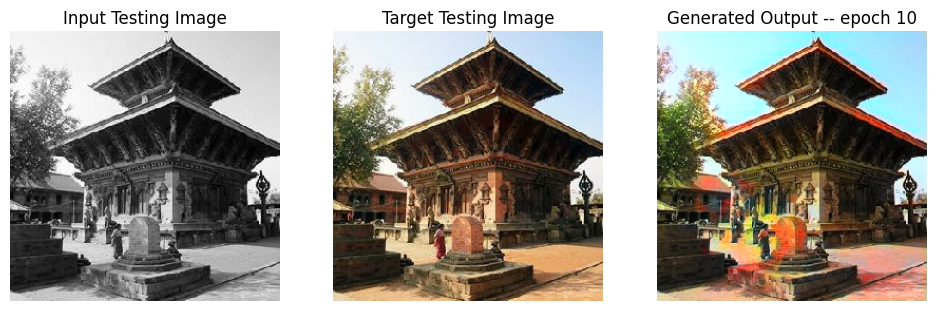

SSIM Score: 0.9244292378425598
PSNR Score: 22.075124740600586
Perceptual Loss: 0.007646261714398861
Epoch 10
Training Details
Generator-- total_loss:2.17587 gan_loss:0.75657 l1_loss:0.03787 perceptual_loss:0.00708 Discriminator-- total_loss:1.37173 real_loss:0.68228 generated_loss:0.68945 --- SSIM 0.93506 PSNR 23.88593
Time taken for epoch 11 is 633.2222564220428 sec
Number of iteration 490
Testing Details
Generator-- total_loss:2.65343 gan_loss:0.70762 l1_loss:0.05124  perceptual_loss:0.01022 Discriminator-- total_loss:1.32007 real_loss:0.71168 generated_loss:0.60840 --- SSIM 0.92179 PSNR 21.47899
Time taken for epoch 11 is 726.326516866684 sec
Number of iteration 140
Epoch 11
Training Details
Generator-- total_loss:4.22059 gan_loss:2.83139 l1_loss:0.03681 perceptual_loss:0.00713 Discriminator-- total_loss:0.63191 real_loss:0.31977 generated_loss:0.31214 --- SSIM 0.93879 PSNR 24.05790
Time taken for epoch 12 is 419.34454131126404 sec
Number of iteration 490
Testing Details
Generator--

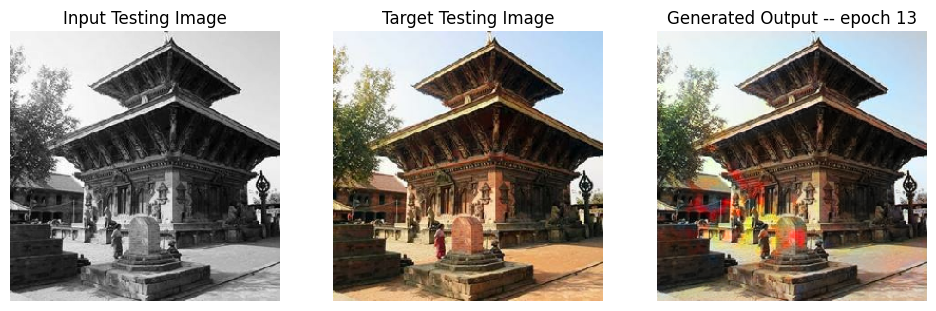

SSIM Score: 0.9607024192810059
PSNR Score: 26.56005859375
Perceptual Loss: 0.0054412344470620155
Epoch 13
Training Details
Generator-- total_loss:8.62647 gan_loss:7.24066 l1_loss:0.03673 perceptual_loss:0.00710 Discriminator-- total_loss:0.56968 real_loss:0.28732 generated_loss:0.28236 --- SSIM 0.93893 PSNR 24.07400
Time taken for epoch 14 is 417.3838212490082 sec
Number of iteration 490
Testing Details
Generator-- total_loss:2.16308 gan_loss:0.53606 l1_loss:0.04274  perceptual_loss:0.00862 Discriminator-- total_loss:2.27000 real_loss:2.06652 generated_loss:0.20348 --- SSIM 0.93090 PSNR 23.29142
Time taken for epoch 14 is 509.68630838394165 sec
Number of iteration 140
Epoch 14
Training Details
Generator-- total_loss:9.28802 gan_loss:7.89750 l1_loss:0.03685 perceptual_loss:0.00713 Discriminator-- total_loss:0.03578 real_loss:0.01691 generated_loss:0.01886 --- SSIM 0.93860 PSNR 24.05520
Time taken for epoch 15 is 418.44729804992676 sec
Number of iteration 490
Testing Details
Generator-- 

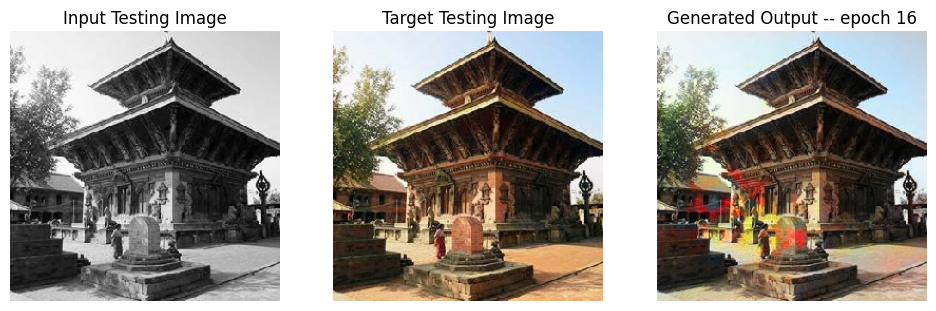

SSIM Score: 0.9605066180229187
PSNR Score: 26.558401107788086
Perceptual Loss: 0.005454011261463165
Epoch 16
Training Details
Generator-- total_loss:11.39463 gan_loss:10.00341 l1_loss:0.03686 perceptual_loss:0.00714 Discriminator-- total_loss:0.00850 real_loss:0.00429 generated_loss:0.00420 --- SSIM 0.93884 PSNR 24.04574
Time taken for epoch 17 is 419.05081844329834 sec
Number of iteration 490
Testing Details
Generator-- total_loss:4.08680 gan_loss:2.47011 l1_loss:0.04243  perceptual_loss:0.00860 Discriminator-- total_loss:1.39994 real_loss:0.37984 generated_loss:1.02011 --- SSIM 0.93186 PSNR 23.34396
Time taken for epoch 17 is 511.1392550468445 sec
Number of iteration 140
Epoch 17
Training Details
Generator-- total_loss:12.59617 gan_loss:11.20626 l1_loss:0.03685 perceptual_loss:0.00711 Discriminator-- total_loss:0.00252 real_loss:0.00123 generated_loss:0.00128 --- SSIM 0.93889 PSNR 24.05719
Time taken for epoch 18 is 418.9791896343231 sec
Number of iteration 490
Testing Details
Genera

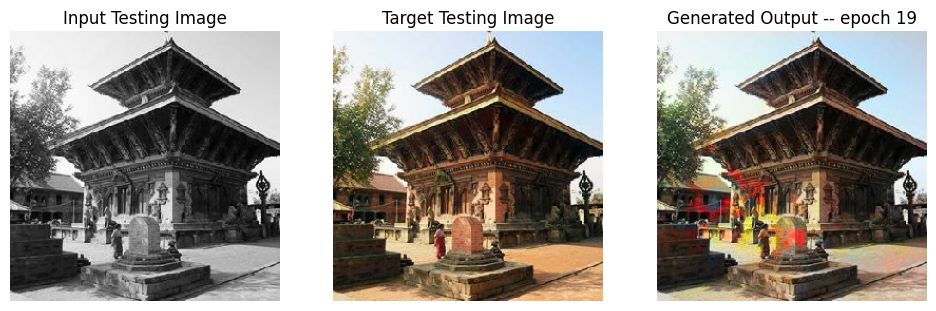

SSIM Score: 0.9604999423027039
PSNR Score: 26.54167366027832
Perceptual Loss: 0.005449554417282343
Epoch 19
Training Details
Generator-- total_loss:9.31104 gan_loss:7.91822 l1_loss:0.03693 perceptual_loss:0.00713 Discriminator-- total_loss:0.03211 real_loss:0.01573 generated_loss:0.01638 --- SSIM 0.93869 PSNR 24.04120
Time taken for epoch 20 is 420.1579728126526 sec
Number of iteration 490
Testing Details
Generator-- total_loss:4.54020 gan_loss:2.91809 l1_loss:0.04260  perceptual_loss:0.00860 Discriminator-- total_loss:1.74777 real_loss:0.27761 generated_loss:1.47016 --- SSIM 0.93132 PSNR 23.31792
Time taken for epoch 20 is 512.1376390457153 sec
Number of iteration 140
Epoch 20
Training Details
Generator-- total_loss:11.60601 gan_loss:10.21582 l1_loss:0.03685 perceptual_loss:0.00712 Discriminator-- total_loss:0.00323 real_loss:0.00162 generated_loss:0.00161 --- SSIM 0.93879 PSNR 24.05583
Time taken for epoch 21 is 418.88797521591187 sec
Number of iteration 490
Testing Details
Generator

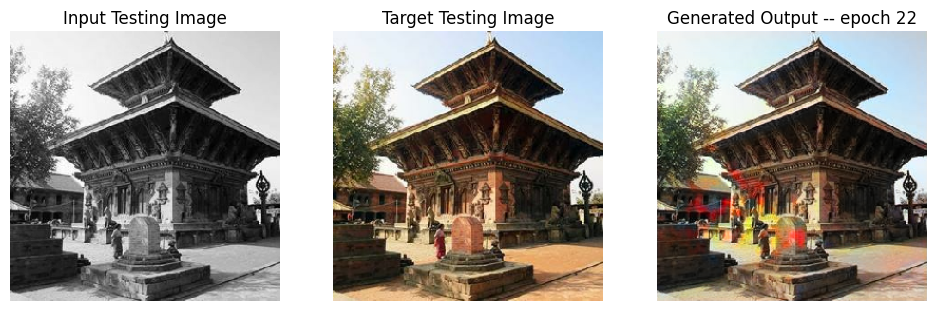

SSIM Score: 0.9608793258666992
PSNR Score: 26.579578399658203
Perceptual Loss: 0.0054166316986083984
Epoch 22
Training Details
Generator-- total_loss:13.79702 gan_loss:12.40802 l1_loss:0.03681 perceptual_loss:0.00712 Discriminator-- total_loss:0.00152 real_loss:0.00092 generated_loss:0.00060 --- SSIM 0.93890 PSNR 24.06412
Time taken for epoch 23 is 419.2270257472992 sec
Number of iteration 490
Testing Details
Generator-- total_loss:8.08750 gan_loss:6.46985 l1_loss:0.04246  perceptual_loss:0.00860 Discriminator-- total_loss:8.99235 real_loss:2.70964 generated_loss:6.28271 --- SSIM 0.93173 PSNR 23.33377
Time taken for epoch 23 is 511.21924781799316 sec
Number of iteration 140
Epoch 23
Training Details
Generator-- total_loss:12.41787 gan_loss:11.02958 l1_loss:0.03679 perceptual_loss:0.00712 Discriminator-- total_loss:0.06336 real_loss:0.03134 generated_loss:0.03202 --- SSIM 0.93882 PSNR 24.06653
Time taken for epoch 24 is 420.26233434677124 sec
Number of iteration 490
Testing Details
Gene

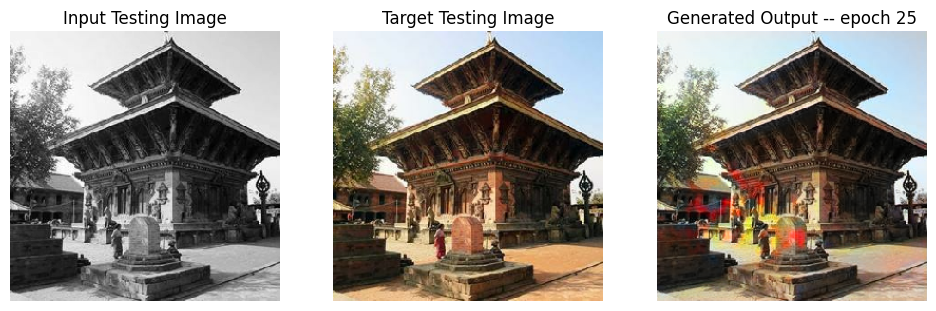

SSIM Score: 0.96030193567276
PSNR Score: 26.518634796142578
Perceptual Loss: 0.005437602289021015
Epoch 25
Training Details
Generator-- total_loss:14.90205 gan_loss:13.51183 l1_loss:0.03684 perceptual_loss:0.00713 Discriminator-- total_loss:0.00366 real_loss:0.00150 generated_loss:0.00215 --- SSIM 0.93874 PSNR 24.05485
Time taken for epoch 26 is 423.46835923194885 sec
Number of iteration 490
Testing Details
Generator-- total_loss:5.83664 gan_loss:4.21919 l1_loss:0.04246  perceptual_loss:0.00859 Discriminator-- total_loss:2.00488 real_loss:0.13409 generated_loss:1.87079 --- SSIM 0.93170 PSNR 23.34156
Time taken for epoch 26 is 517.0976934432983 sec
Number of iteration 140
Epoch 26
Training Details
Generator-- total_loss:15.97937 gan_loss:14.59245 l1_loss:0.03676 perceptual_loss:0.00710 Discriminator-- total_loss:0.00049 real_loss:0.00027 generated_loss:0.00022 --- SSIM 0.93892 PSNR 24.06545
Time taken for epoch 27 is 423.7686378955841 sec
Number of iteration 490
Testing Details
Generato

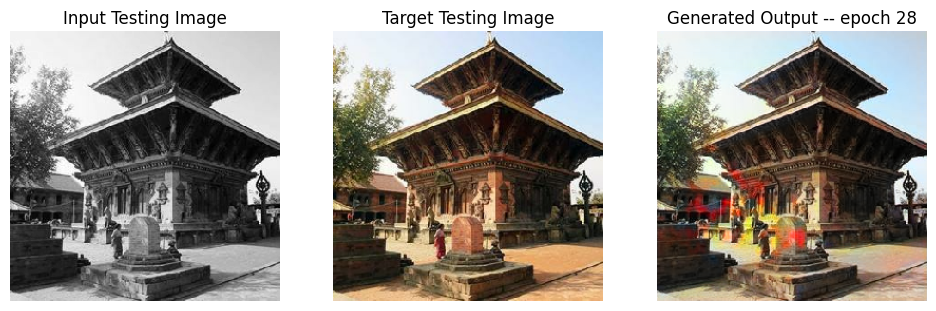

SSIM Score: 0.9600593447685242
PSNR Score: 26.498464584350586
Perceptual Loss: 0.00547071872279048
Epoch 28
Training Details
Generator-- total_loss:12.91939 gan_loss:11.52849 l1_loss:0.03685 perceptual_loss:0.00713 Discriminator-- total_loss:0.00254 real_loss:0.00136 generated_loss:0.00119 --- SSIM 0.93870 PSNR 24.05419
Time taken for epoch 29 is 422.9834864139557 sec
Number of iteration 490
Testing Details
Generator-- total_loss:6.41117 gan_loss:4.78774 l1_loss:0.04264  perceptual_loss:0.00861 Discriminator-- total_loss:2.68132 real_loss:0.09583 generated_loss:2.58549 --- SSIM 0.93131 PSNR 23.31132
Time taken for epoch 29 is 515.86412525177 sec
Number of iteration 140
Epoch 29
Training Details
Generator-- total_loss:14.42229 gan_loss:13.03225 l1_loss:0.03685 perceptual_loss:0.00711 Discriminator-- total_loss:0.00108 real_loss:0.00055 generated_loss:0.00052 --- SSIM 0.93879 PSNR 24.05821
Time taken for epoch 30 is 424.95916199684143 sec
Number of iteration 490
Testing Details
Generator

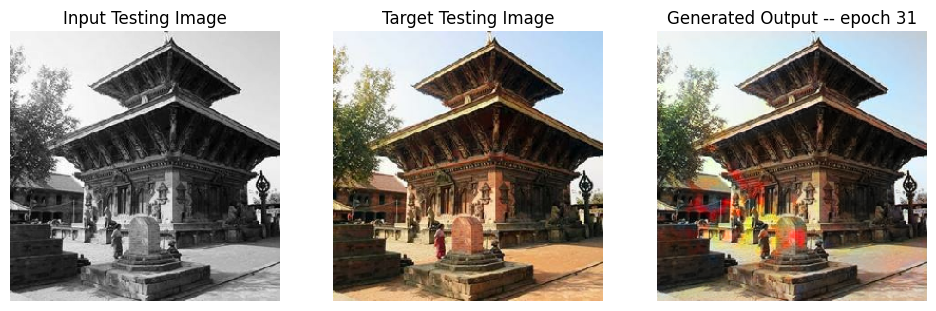

SSIM Score: 0.9605133533477783
PSNR Score: 26.54945182800293
Perceptual Loss: 0.005428355187177658
Epoch 31
Training Details
Generator-- total_loss:15.87153 gan_loss:14.48482 l1_loss:0.03675 perceptual_loss:0.00710 Discriminator-- total_loss:0.00042 real_loss:0.00024 generated_loss:0.00018 --- SSIM 0.93881 PSNR 24.06247
Time taken for epoch 32 is 424.2236530780792 sec
Number of iteration 490
Testing Details
Generator-- total_loss:8.05442 gan_loss:6.42787 l1_loss:0.04272  perceptual_loss:0.00862 Discriminator-- total_loss:4.15209 real_loss:0.03617 generated_loss:4.11592 --- SSIM 0.93102 PSNR 23.29043
Time taken for epoch 32 is 517.838591337204 sec
Number of iteration 140
Epoch 32
Training Details
Generator-- total_loss:15.81488 gan_loss:14.42831 l1_loss:0.03674 perceptual_loss:0.00711 Discriminator-- total_loss:0.28058 real_loss:0.11845 generated_loss:0.16213 --- SSIM 0.93887 PSNR 24.07261
Time taken for epoch 33 is 425.3844771385193 sec
Number of iteration 490
Testing Details
Generator

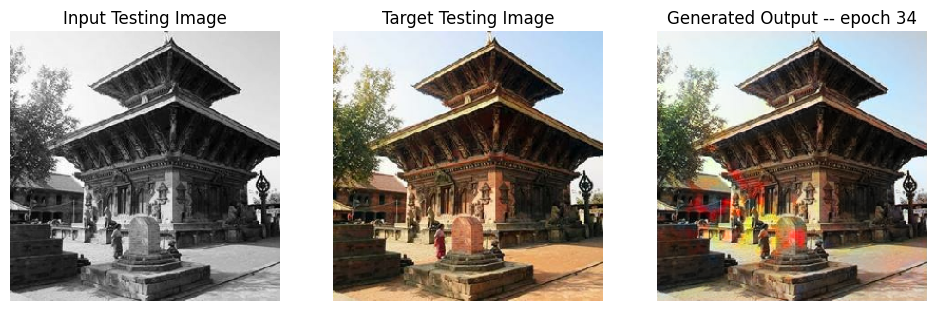

SSIM Score: 0.9606835842132568
PSNR Score: 26.575435638427734
Perceptual Loss: 0.005414668936282396
Epoch 34
Training Details
Generator-- total_loss:13.82403 gan_loss:12.43627 l1_loss:0.03677 perceptual_loss:0.00712 Discriminator-- total_loss:0.00194 real_loss:0.00101 generated_loss:0.00093 --- SSIM 0.93892 PSNR 24.06442
Time taken for epoch 35 is 428.06786847114563 sec
Number of iteration 490
Testing Details
Generator-- total_loss:5.62393 gan_loss:4.00415 l1_loss:0.04251  perceptual_loss:0.00861 Discriminator-- total_loss:2.24444 real_loss:0.28458 generated_loss:1.95986 --- SSIM 0.93147 PSNR 23.32521
Time taken for epoch 35 is 521.2391910552979 sec
Number of iteration 140
Epoch 35
Training Details
Generator-- total_loss:14.86582 gan_loss:13.47555 l1_loss:0.03685 perceptual_loss:0.00712 Discriminator-- total_loss:0.00096 real_loss:0.00054 generated_loss:0.00042 --- SSIM 0.93879 PSNR 24.05478
Time taken for epoch 36 is 429.7331099510193 sec
Number of iteration 490
Testing Details
Genera

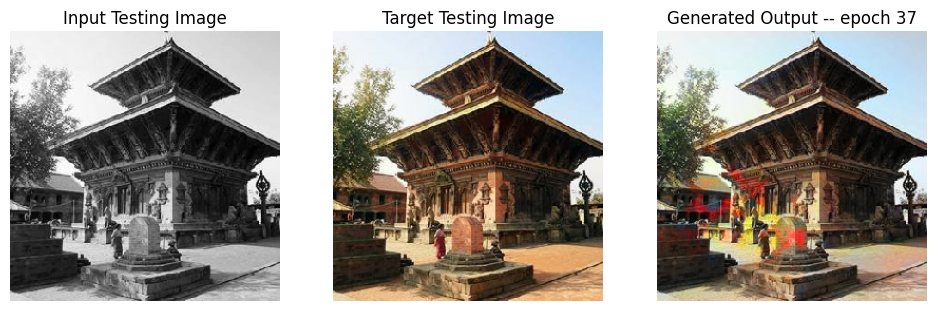

SSIM Score: 0.9603166580200195
PSNR Score: 26.529813766479492
Perceptual Loss: 0.005459954496473074
Epoch 37
Training Details
Generator-- total_loss:16.12320 gan_loss:14.73468 l1_loss:0.03680 perceptual_loss:0.00711 Discriminator-- total_loss:0.19920 real_loss:0.12482 generated_loss:0.07438 --- SSIM 0.93883 PSNR 24.06367
Time taken for epoch 38 is 431.24564957618713 sec
Number of iteration 490
Testing Details
Generator-- total_loss:8.31202 gan_loss:6.69431 l1_loss:0.04247  perceptual_loss:0.00859 Discriminator-- total_loss:4.06531 real_loss:0.23367 generated_loss:3.83164 --- SSIM 0.93182 PSNR 23.33945
Time taken for epoch 38 is 525.1410717964172 sec
Number of iteration 140
Epoch 38
Training Details
Generator-- total_loss:13.77153 gan_loss:12.38391 l1_loss:0.03677 perceptual_loss:0.00711 Discriminator-- total_loss:0.00279 real_loss:0.00143 generated_loss:0.00137 --- SSIM 0.93893 PSNR 24.06198
Time taken for epoch 39 is 426.9832181930542 sec
Number of iteration 490
Testing Details
Genera

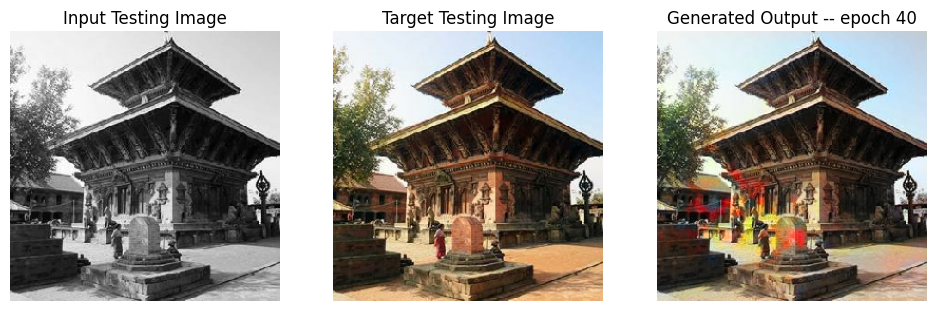

SSIM Score: 0.9599452018737793
PSNR Score: 26.476842880249023
Perceptual Loss: 0.005479430314153433
Epoch 40
Training Details
Generator-- total_loss:15.32485 gan_loss:13.93784 l1_loss:0.03674 perceptual_loss:0.00712 Discriminator-- total_loss:0.00077 real_loss:0.00041 generated_loss:0.00036 --- SSIM 0.93895 PSNR 24.07480
Time taken for epoch 41 is 426.49405169487 sec
Number of iteration 490
Testing Details
Generator-- total_loss:7.02116 gan_loss:5.39620 l1_loss:0.04269  perceptual_loss:0.00861 Discriminator-- total_loss:3.25173 real_loss:0.09343 generated_loss:3.15830 --- SSIM 0.93113 PSNR 23.30011
Time taken for epoch 41 is 519.4413785934448 sec
Number of iteration 140
Epoch 41
Training Details
Generator-- total_loss:15.44885 gan_loss:14.05772 l1_loss:0.03685 perceptual_loss:0.00714 Discriminator-- total_loss:0.06503 real_loss:0.04119 generated_loss:0.02384 --- SSIM 0.93858 PSNR 24.05002
Time taken for epoch 42 is 427.58688616752625 sec
Number of iteration 490
Testing Details
Generato

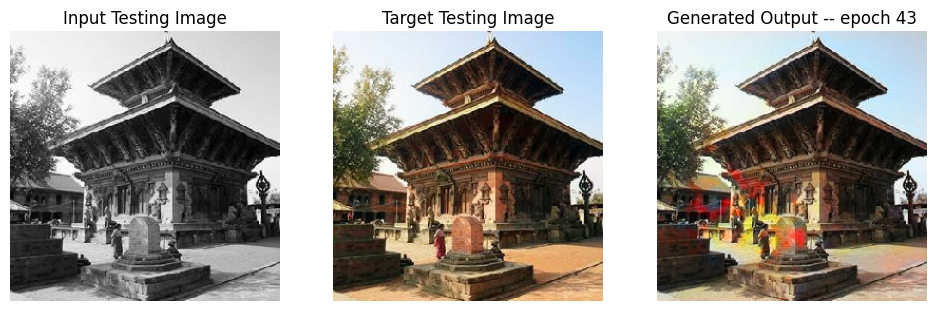

SSIM Score: 0.95973140001297
PSNR Score: 26.473007202148438
Perceptual Loss: 0.005474042147397995
Epoch 43
Training Details
Generator-- total_loss:16.34581 gan_loss:14.95646 l1_loss:0.03680 perceptual_loss:0.00713 Discriminator-- total_loss:0.00082 real_loss:0.00043 generated_loss:0.00039 --- SSIM 0.93879 PSNR 24.06158
Time taken for epoch 44 is 433.22697377204895 sec
Number of iteration 490
Testing Details
Generator-- total_loss:6.80136 gan_loss:5.18588 l1_loss:0.04240  perceptual_loss:0.00859 Discriminator-- total_loss:2.46148 real_loss:0.22164 generated_loss:2.23985 --- SSIM 0.93182 PSNR 23.34704
Time taken for epoch 44 is 527.6150362491608 sec
Number of iteration 140
Epoch 44
Training Details
Generator-- total_loss:16.82398 gan_loss:15.43549 l1_loss:0.03681 perceptual_loss:0.00710 Discriminator-- total_loss:0.00044 real_loss:0.00022 generated_loss:0.00021 --- SSIM 0.93904 PSNR 24.06895
Time taken for epoch 45 is 421.0298309326172 sec
Number of iteration 490
Testing Details
Generato

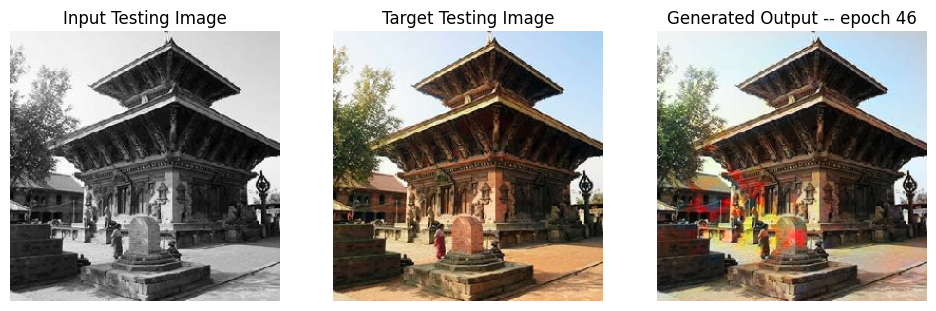

SSIM Score: 0.9606615900993347
PSNR Score: 26.56309700012207
Perceptual Loss: 0.005444234237074852


In [42]:
fit(train_dataset, epochs, test_dataset, gen)

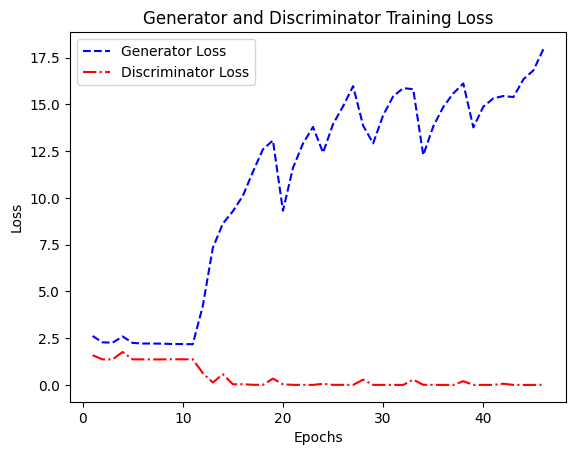

In [43]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

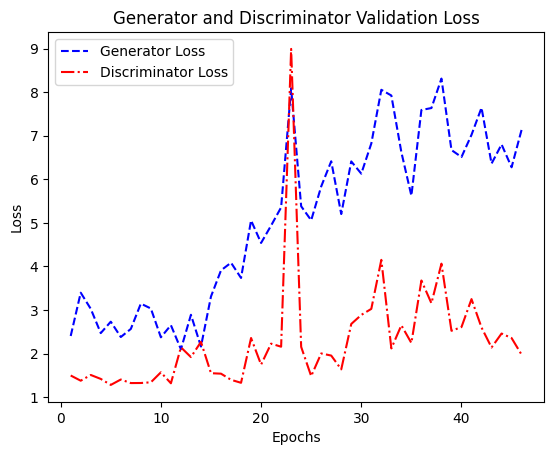

In [44]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

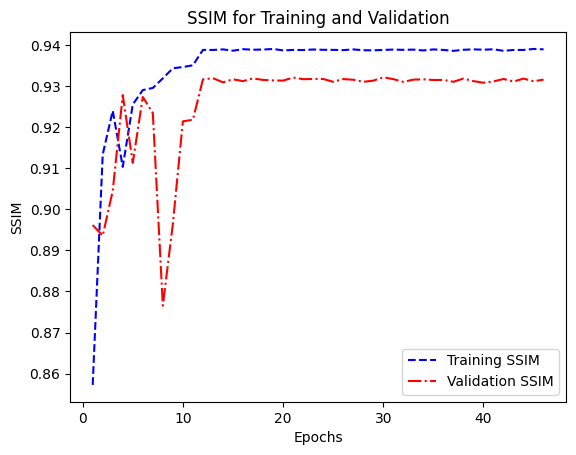

In [45]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.r', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

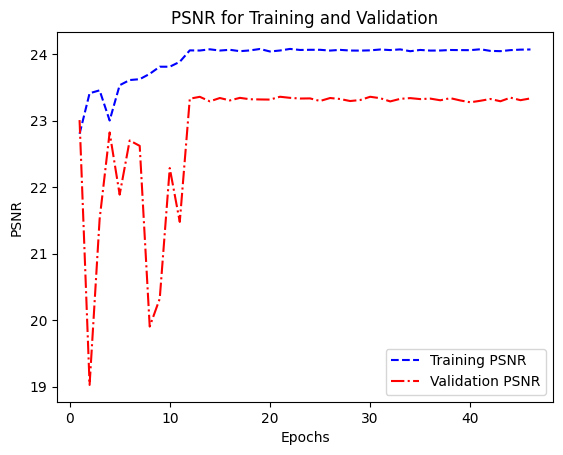

In [46]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.r', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

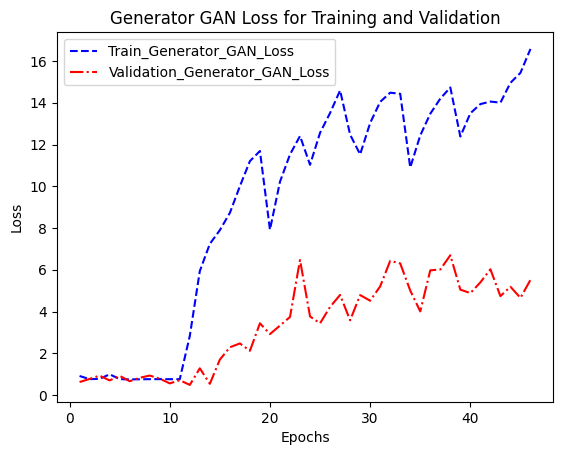

In [47]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

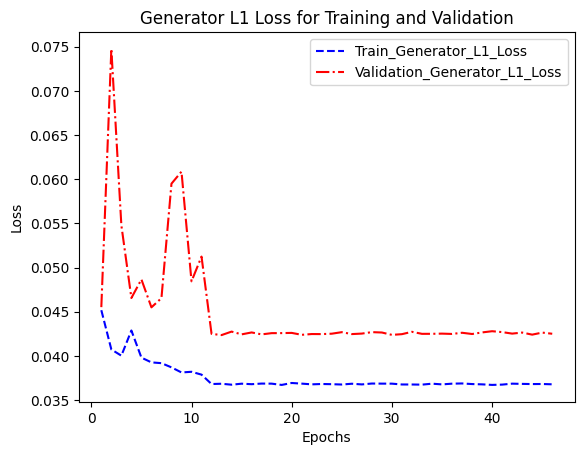

In [48]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

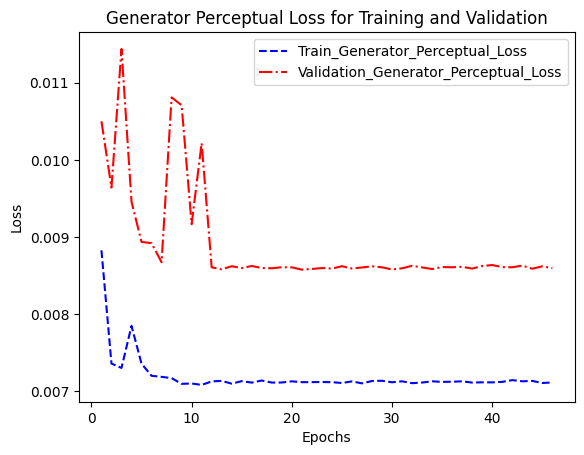

In [49]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.r', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

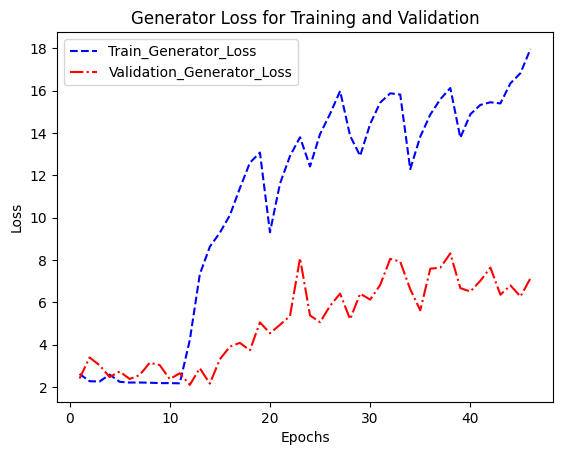

In [50]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

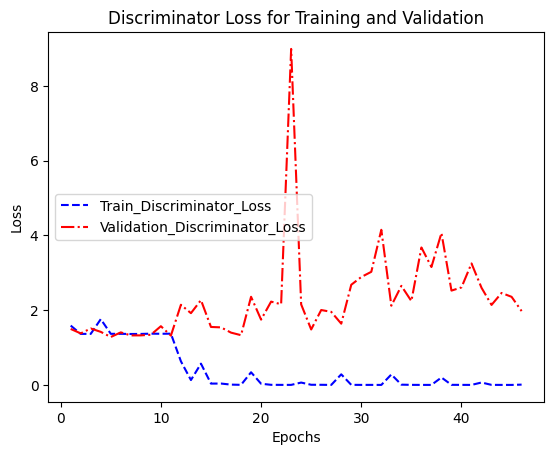

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

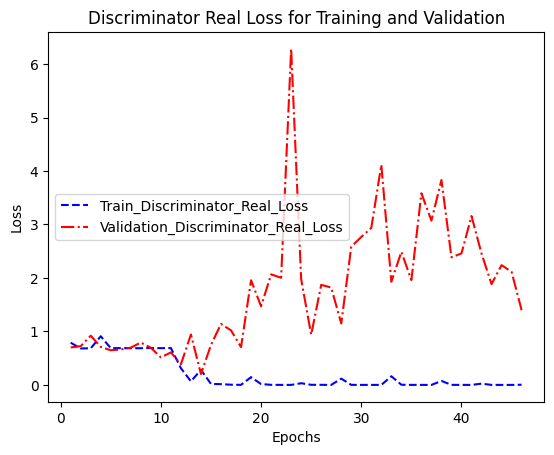

In [52]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

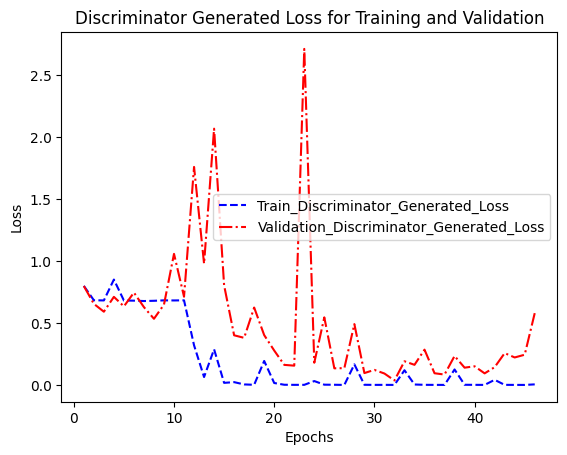

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [54]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [55]:
os.mkdir('/kaggle/working/modelsFeb7')

In [56]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [57]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [58]:
import subprocess
from IPython.display import FileLink, display

In [59]:
download_file('/kaggle/working', 'outputFeb7')

/kaggle/working/outputFeb7.zip